In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import netCDF4 as nc

import sys
sys.path.append('/home/z5297792/UNSW-MRes/MRes/SEACOFS_dataset') 
from clim_functions import tilt_distance_Li, plot_tilt_method, bearing


In [2]:
df_eddies = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/df_eddies_processed.pkl')
df_tilt = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/df_tilt.pkl')
df_eddies = df_eddies.merge(
    df_tilt[['Eddy', 'Day', 'TiltDis', 'TiltDir']],
    how='left',
    left_on=['Eddy', 'Day'],
    right_on=['Eddy', 'Day']
)
df_AE = df_eddies[df_eddies.Cyc=='AE'].copy().dropna()
df_CE = df_eddies[df_eddies.Cyc=='CE'].copy().dropna()
df_eddies


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,q22,Rc,psi0,AR,R,Age,Date,fname,TiltDis,TiltDir
0,1,1462,CE,161.072036,-29.736582,261,274,928.181752,1356.070550,-0.000016,...,1.123684,118.032741,47.992205,1.501133,74.597458,107,1994-01-02,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
1,1,1463,CE,160.820027,-29.753172,257,272,905.254559,1345.866439,-0.000020,...,1.022306,108.004573,52.019741,1.386398,68.599374,107,1994-01-03,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
2,1,1464,CE,160.892701,-29.754904,258,273,912.061191,1348.117301,-0.000012,...,0.765331,109.827647,54.305771,1.458227,78.300764,107,1994-01-04,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
3,1,1465,CE,160.929437,-29.612368,258,276,911.162024,1364.461638,-0.000019,...,0.871468,111.650721,56.591801,1.411879,69.625773,107,1994-01-05,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,33.976111,184.917110
4,1,1466,CE,160.908986,-29.586156,258,277,908.463829,1366.554462,-0.000019,...,0.945071,115.925719,57.471319,1.597888,72.613632,107,1994-01-06,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,30.065523,181.172847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157793,3842,10646,CE,155.134295,-40.092889,223,14,711.617369,69.895295,-0.000013,...,0.903800,57.890310,10.534469,1.148690,54.275882,22,2019-02-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,23.512541,69.098943
157794,3842,10647,CE,154.883954,-40.396445,221,6,699.853461,30.349325,-0.000007,...,1.216728,61.813856,10.733594,1.253634,46.817975,22,2019-02-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,20.463430,69.913173
157795,3842,10648,CE,155.001742,-40.518521,223,4,713.016589,20.865525,-0.000007,...,1.267517,65.737402,10.932719,1.306102,46.695383,22,2019-02-26,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN
157796,3842,10649,CE,155.187153,-40.282064,225,10,721.413917,51.393389,-0.000010,...,1.276832,69.660948,11.131844,1.241162,47.190073,22,2019-02-27,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,NaN,NaN


In [3]:
dic_vert = pd.read_pickle('/srv/scratch/z5297792/SEACOFS_26yr_eddy_dataset/dic_vert_doppio.pkl')


In [4]:
df_eddies['day_idx'] = (
    df_eddies.groupby('Eddy')['Day']
    .transform(lambda x: x - x.iloc[0])
)
df_large_tilt = df_eddies[df_eddies.TiltDis > 250]
df_large_tilt


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,Rc,psi0,AR,R,Age,Date,fname,TiltDis,TiltDir,day_idx
31387,757,3310,AE,154.480858,-32.390238,154,174,412.168702,860.169002,0.000011,...,67.607528,-24.147359,1.322298,73.659236,39,1999-01-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,266.951190,11.977020,33
31388,757,3311,AE,154.390299,-32.408994,151,173,404.725356,855.301043,0.000012,...,67.607528,-24.147359,1.553911,94.332458,39,1999-01-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,251.558364,11.627770,34
66593,1613,5341,CE,160.467064,-28.356465,244,300,829.233507,1481.824319,-0.000006,...,117.777371,17.026002,1.733987,69.525516,22,2004-08-16,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,259.587532,278.918881,5
113457,2771,8059,AE,155.280579,-30.186339,153,226,409.064318,1116.452071,0.000008,...,34.417076,-3.915447,1.442718,57.870157,27,2012-01-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,255.275450,19.857557,16
113458,2771,8060,AE,155.104236,-30.223222,148,224,394.247270,1106.805898,0.000008,...,34.417076,-3.915447,1.483983,47.578903,27,2012-01-26,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,261.458384,19.636848,17
113459,2771,8061,AE,154.927701,-30.260107,143,222,379.430221,1097.159724,0.000008,...,34.417076,-3.915447,1.527033,37.287649,27,2012-01-27,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,263.158584,19.533925,18


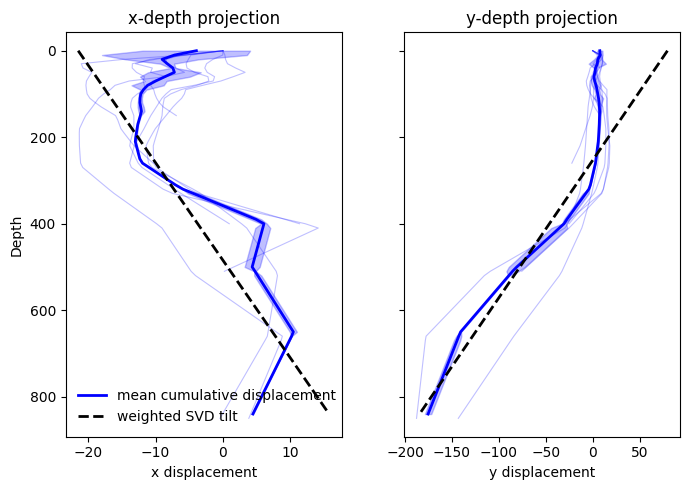

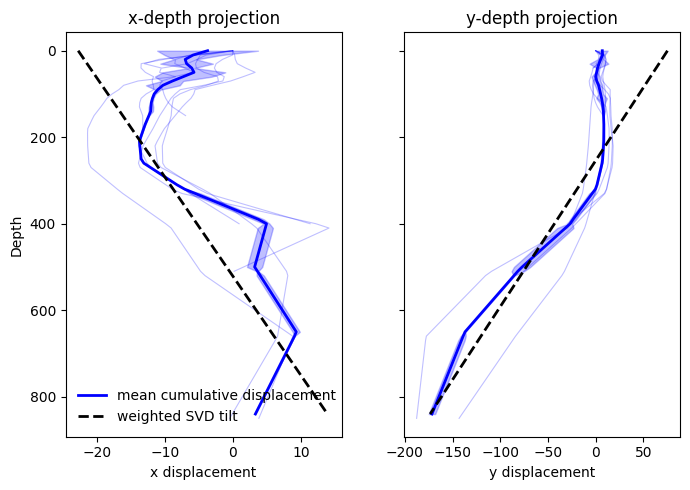

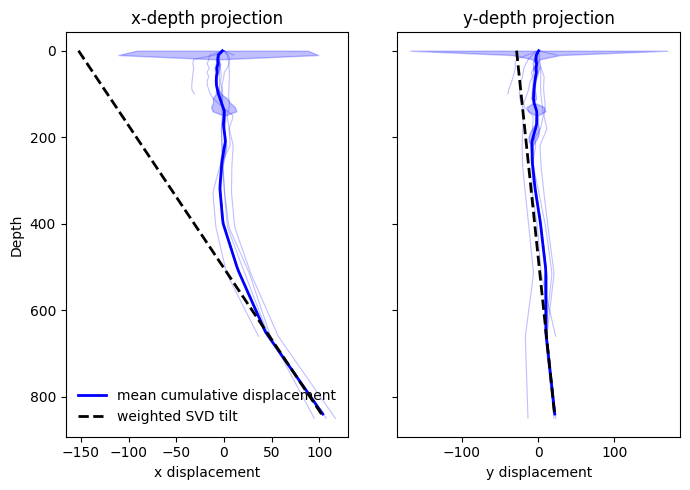

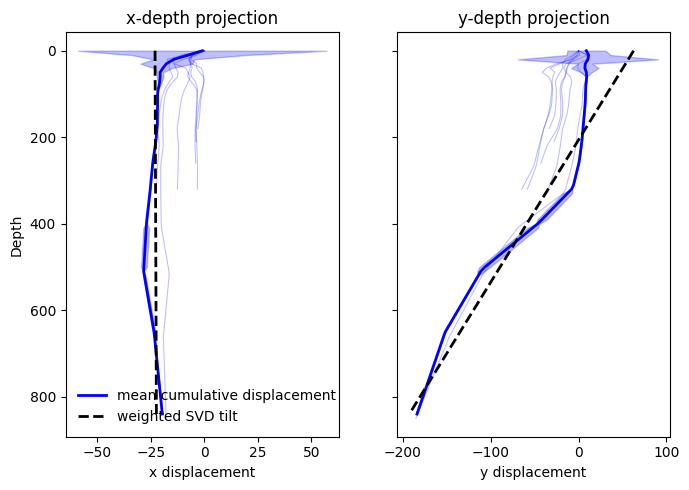

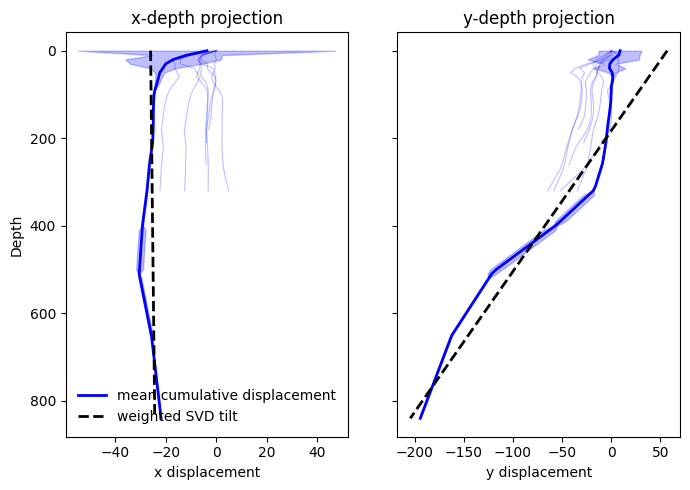

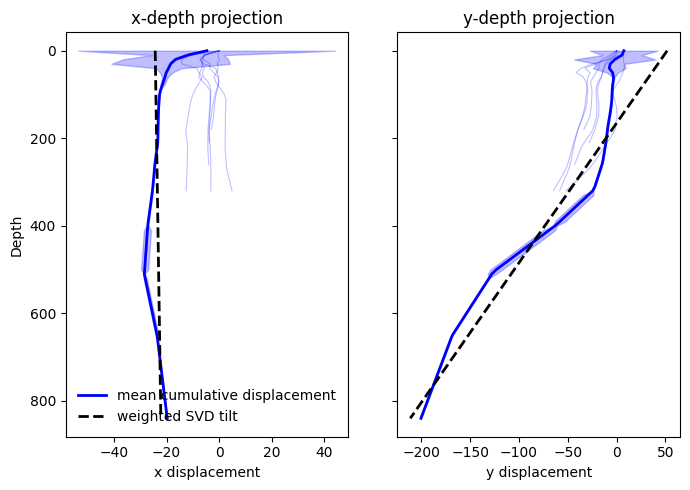

In [5]:
# ks = np.array([10, 50, 70, 100, 10, 130, 140, 150, 180, 200])
# ks += 7

for k in range(len(df_large_tilt)):

    data = df_large_tilt.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )



In [6]:
max_spreads = []
for row in df_eddies.itertuples(index=False):
    try:
        df = dic_vert[f'Eddy{row.Eddy}'][f'Day{row.Day}']

        max_spread, _, _ = tilt_distance_Li(
            df['xc'].values,
            df['yc'].values,
            np.abs(df['Depth'].values),
            zmax=1000
        )
    except Exception:
        max_spread = np.nan
    max_spreads.append(max_spread)

df_eddies['max_spread'] = max_spreads


In [7]:
df_eddies['tdiff'] = (df_eddies.TiltDis - df_eddies.max_spread).abs()


<Axes: >

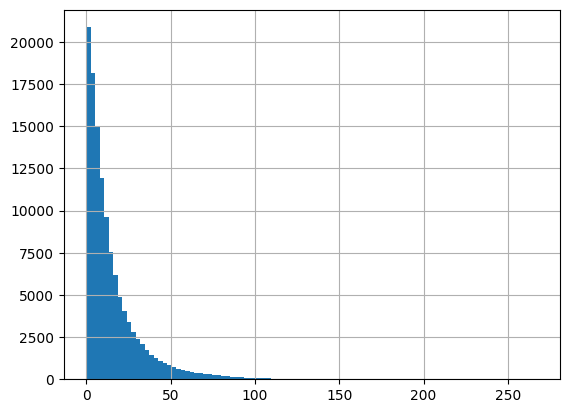

In [8]:
df_eddies['tdiff'].hist(bins=100)


In [9]:
df_large_diff = df_eddies[df_eddies.tdiff > 200]
df_large_diff


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,AR,R,Age,Date,fname,TiltDis,TiltDir,day_idx,max_spread,tdiff
15811,379,2362,CE,159.419589,-31.896377,246,217,841.293940,1072.318491,-0.000033,...,1.530772,20.888618,23,1996-06-20,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,13.601414,54.728535,3,280.862164,267.260750
19230,472,2562,AE,159.002843,-27.678548,215,304,669.967527,1503.702723,0.000030,...,1.211069,38.587349,56,1997-01-06,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,6.838369,37.192535,38,225.415033,218.576663
31387,757,3310,AE,154.480858,-32.390238,154,174,412.168702,860.169002,0.000011,...,1.322298,73.659236,39,1999-01-24,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,266.951190,11.977020,33,57.515402,209.435787
40572,975,3804,AE,157.711291,-31.735130,217,209,681.242848,1033.524041,0.000016,...,1.386372,31.809845,40,2000-06-01,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,103.672040,21.486629,29,321.094661,217.422621
51041,1235,4412,CE,157.040529,-37.784981,240,75,804.809602,372.116264,-0.000006,...,1.435362,48.212566,52,2002-01-30,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,200.421920,206.686328,9,0.000000,200.421920
66593,1613,5341,CE,160.467064,-28.356465,244,300,829.233507,1481.824319,-0.000006,...,1.733987,69.525516,22,2004-08-16,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,259.587532,278.918881,5,53.176277,206.411255
69137,1669,5476,CE,159.279096,-34.014193,255,171,891.312545,843.003049,-0.000017,...,2.399413,44.794025,23,2004-12-29,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,54.780055,158.901934,8,314.425028,259.644973
113457,2771,8059,AE,155.280579,-30.186339,153,226,409.064318,1116.452071,0.000008,...,1.442718,57.870157,27,2012-01-25,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,255.275450,19.857557,16,41.069472,214.205978
113458,2771,8060,AE,155.104236,-30.223222,148,224,394.247270,1106.805898,0.000008,...,1.483983,47.578903,27,2012-01-26,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,261.458384,19.636848,17,48.378567,213.079817


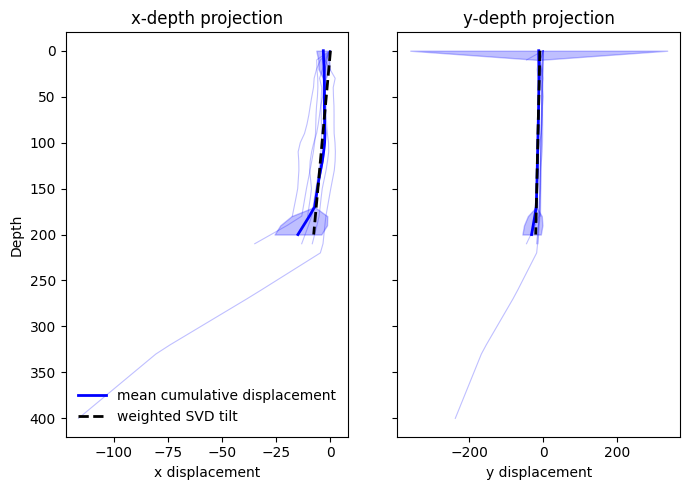

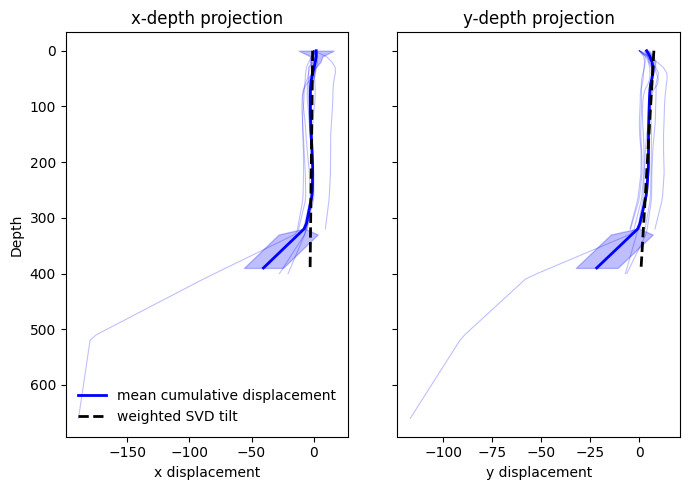

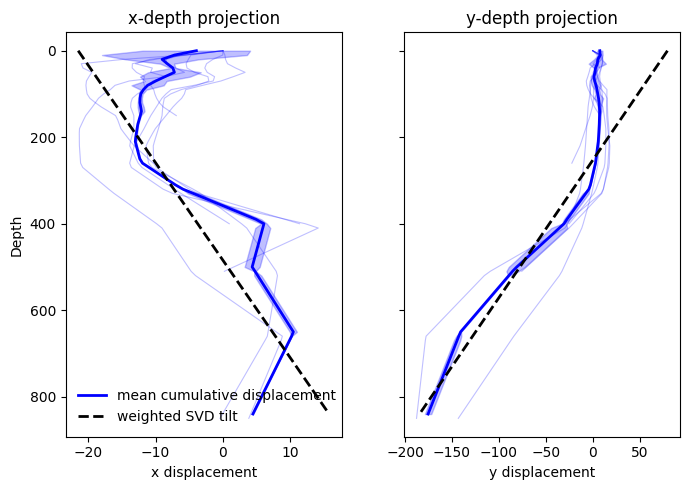

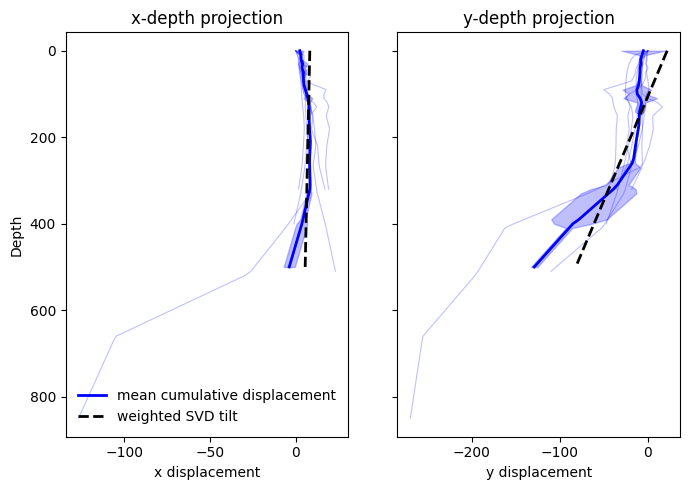

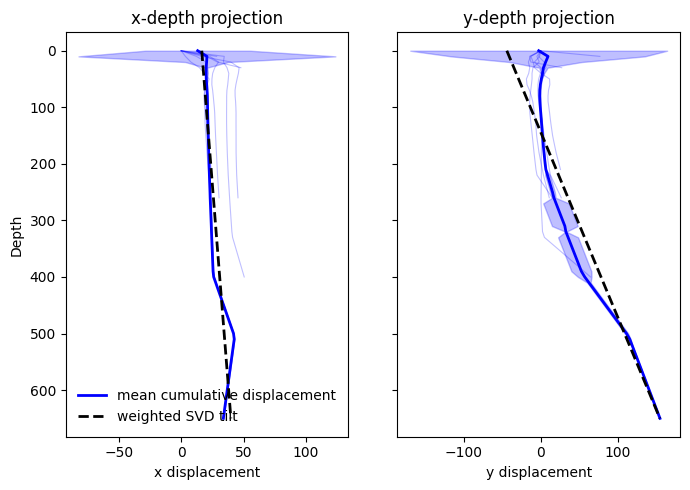

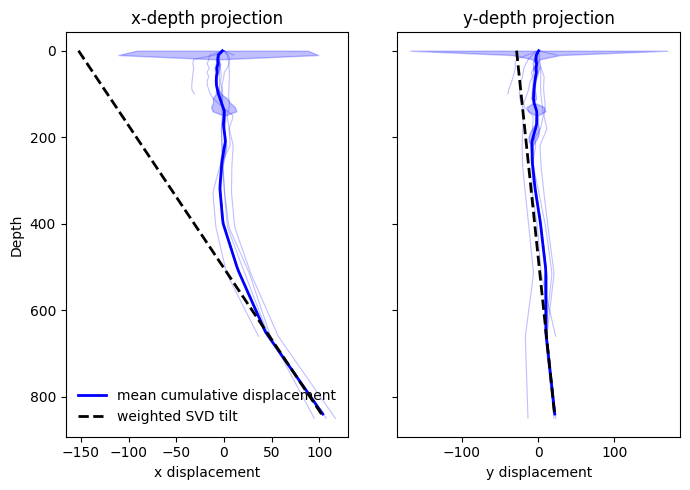

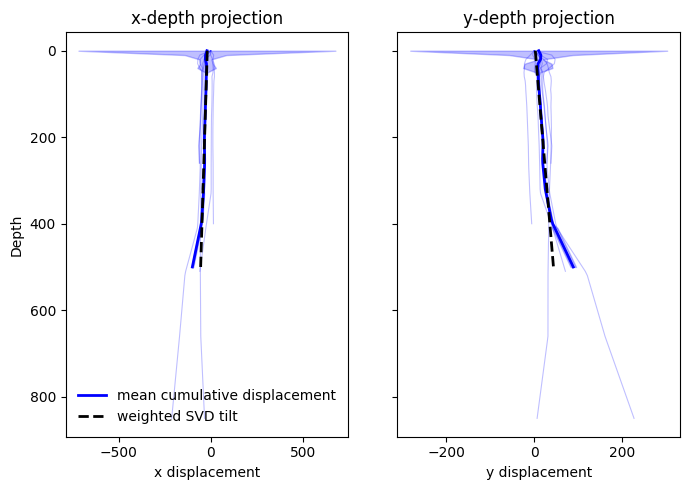

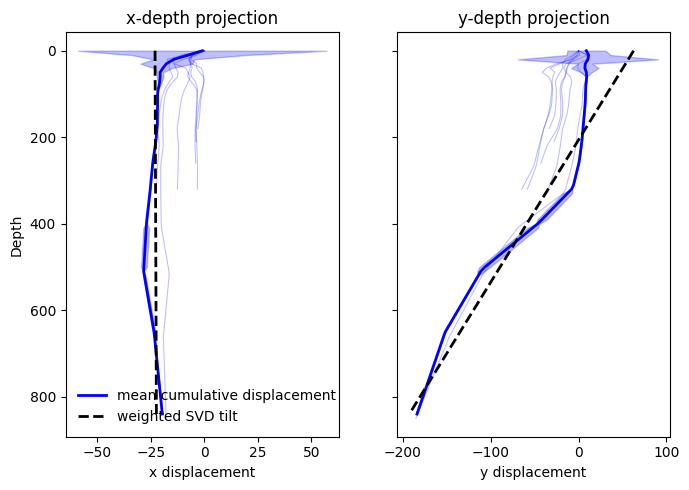

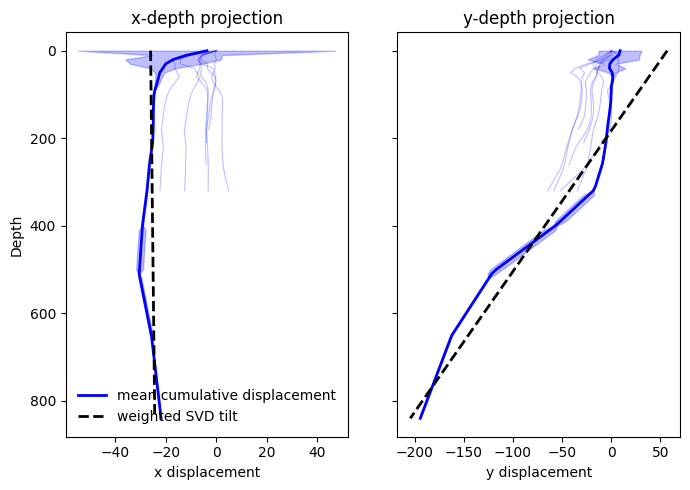

In [10]:
for k in range(len(df_large_diff)):

    data = df_large_diff.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )
    

<Axes: >

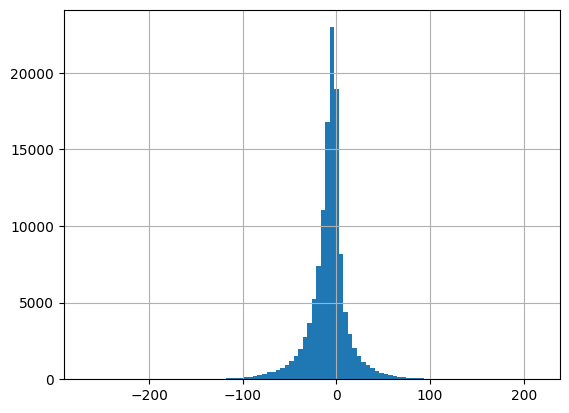

In [11]:
df_eddies['tvecdiff'] = df_eddies.TiltDis - df_eddies.max_spread
df_eddies.tvecdiff.hist(bins=100)


In [12]:
df_big_tilt_to_spread = df_eddies[df_eddies.tvecdiff > 100]
df_big_tilt_to_spread


,Eddy,Day,Cyc,lon,lat,ic,jc,xc,yc,w,...,R,Age,Date,fname,TiltDis,TiltDir,day_idx,max_spread,tdiff,tvecdiff
47,1,1509,CE,159.811221,-30.451289,245,251,833.179639,1238.271111,-0.000019,...,55.295499,107,1994-02-18,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,151.164797,96.800656,47,15.711227,135.453570,135.453570
2464,49,1570,CE,155.619549,-37.953551,219,63,689.221770,310.964584,-0.000005,...,48.392665,26,1994-04-20,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,106.121497,51.003403,13,0.000000,106.121497,106.121497
2465,49,1571,CE,155.542159,-37.932344,217,63,682.045883,310.858418,-0.000005,...,45.187181,26,1994-04-21,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,106.121497,51.003403,14,0.000000,106.121497,106.121497
3074,63,1624,AE,159.380195,-28.259850,226,295,724.239442,1455.266972,0.000023,...,36.002215,46,1994-06-13,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,211.819558,77.990360,31,69.261036,142.558521,142.558521
3168,66,1619,CE,158.966971,-30.840595,234,237,767.617865,1169.148754,-0.000014,...,59.414673,47,1994-06-08,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,151.804479,93.072170,15,36.586527,115.217952,115.217952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154589,3756,10411,CE,155.195868,-34.123208,185,142,533.139499,701.438665,-0.000029,...,44.825694,56,2018-07-04,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,129.694906,106.232805,4,16.660758,113.034149,113.034149
157068,3821,10633,AE,157.474521,-31.492182,211,213,652.043514,1051.390444,0.000028,...,46.695388,60,2019-02-11,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,208.289175,78.213440,50,35.036613,173.252562,173.252562
157069,3821,10634,AE,157.567889,-31.436990,213,215,658.758304,1060.255963,0.000037,...,45.526746,60,2019-02-12,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,185.637266,76.119059,51,62.923554,122.713711,122.713711
157072,3821,10637,AE,156.899399,-31.410725,200,211,597.242999,1041.173648,0.000028,...,37.833744,60,2019-02-15,/srv/scratch/z3533156/26year_BRAN2020/outer_av...,172.455796,73.893187,54,59.929577,112.526219,112.526219


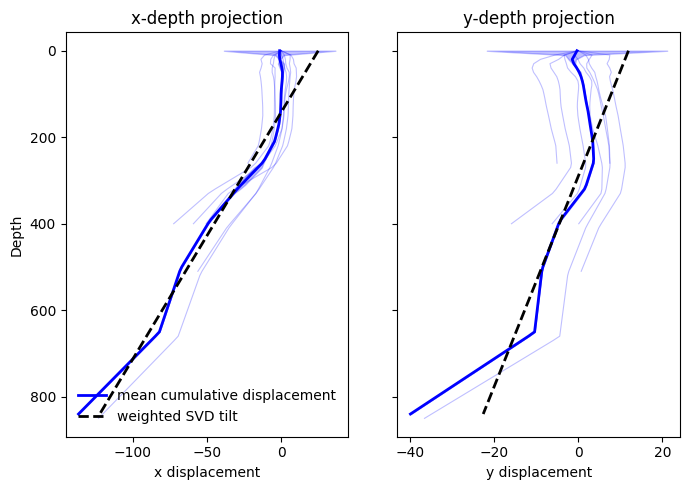

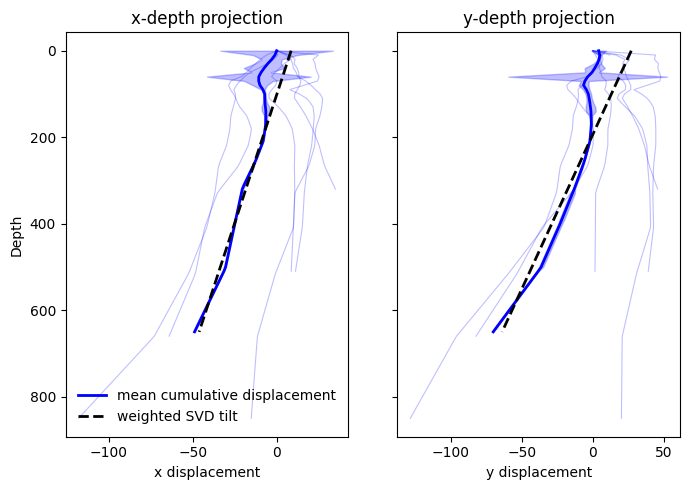

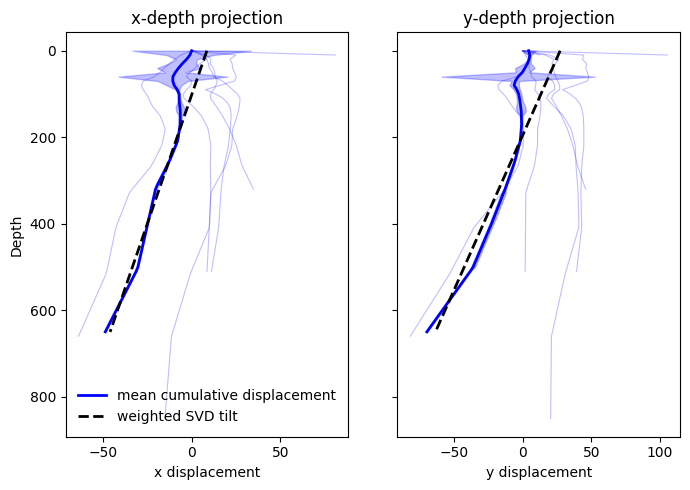

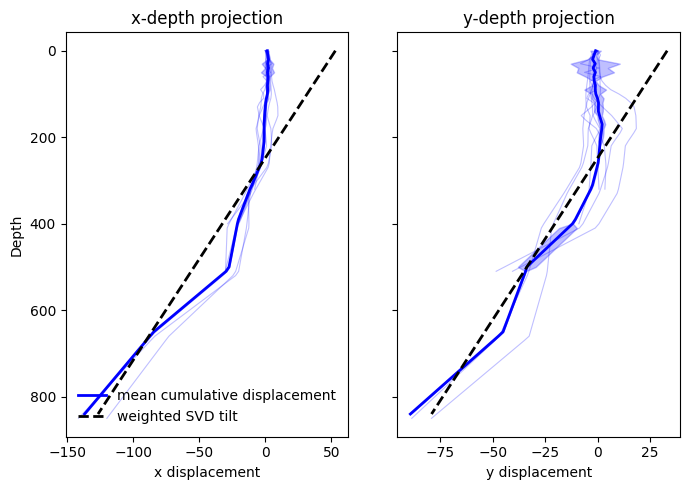

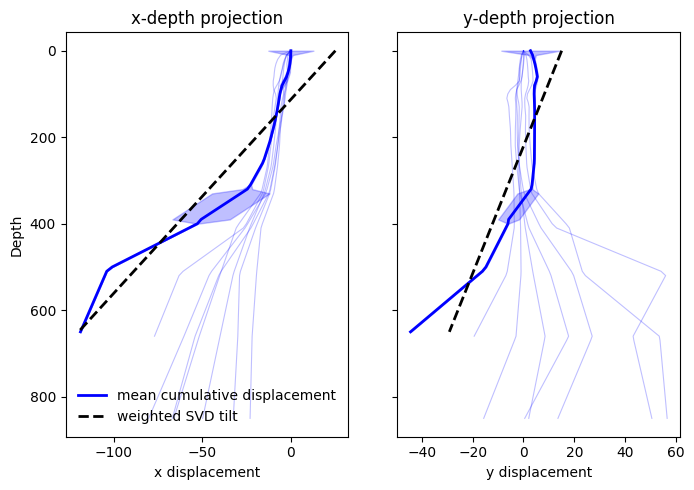

...

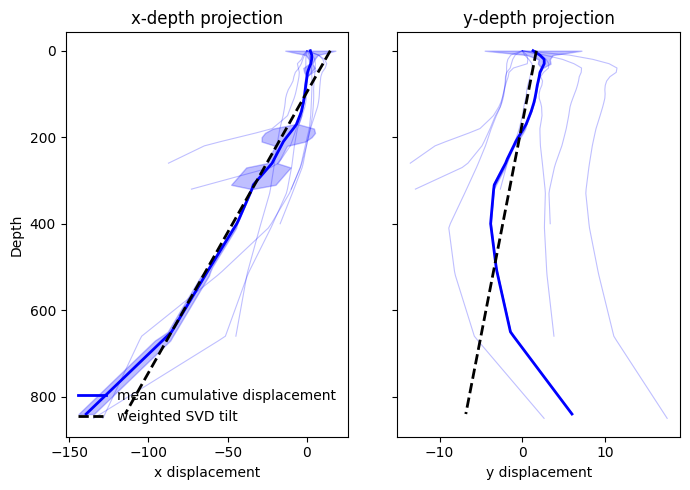

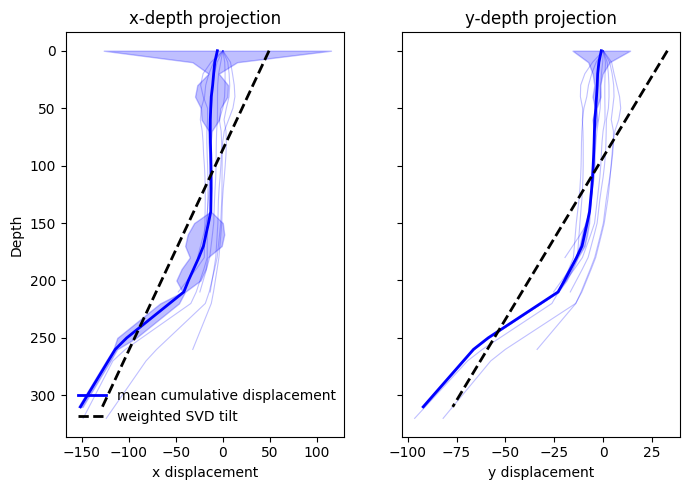

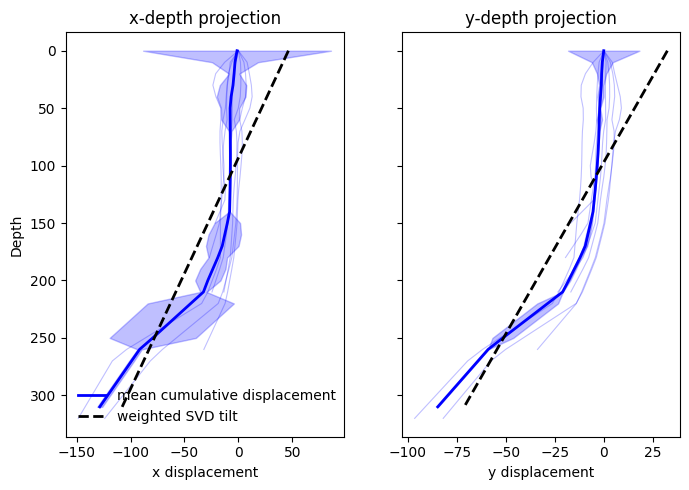

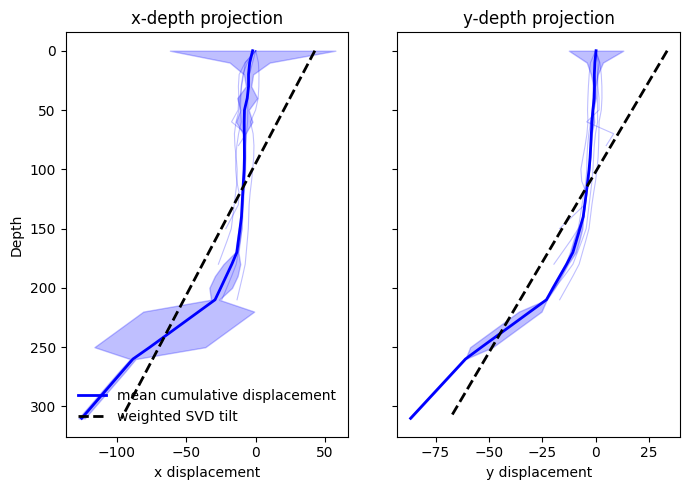

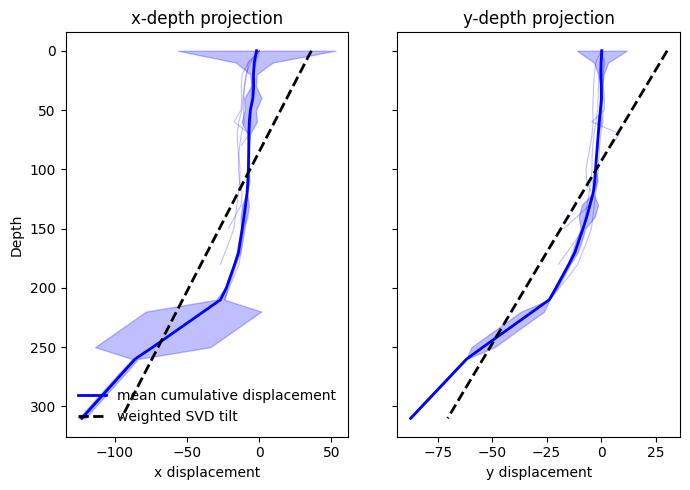

In [13]:
for k in range(len(df_big_tilt_to_spread)):

    data = df_big_tilt_to_spread.iloc[k]
    eddy, ref_day = data.Eddy, data.day_idx
    
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=eddy,
        ref_day_idx=ref_day,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )
    

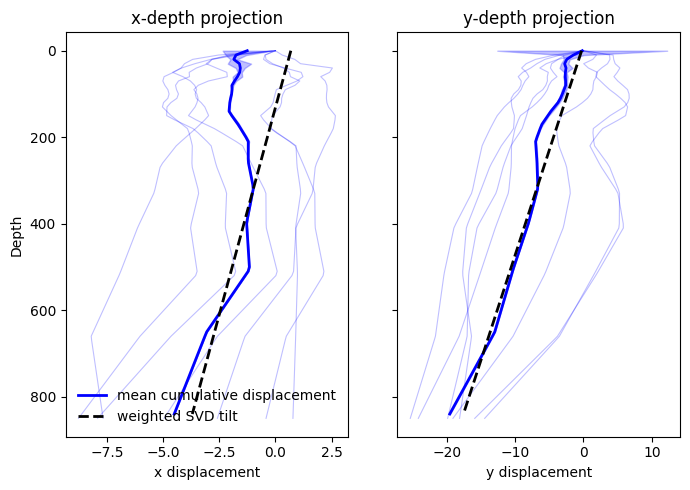

(<Figure size 700x500 with 2 Axes>,
 (<Axes: title={'center': 'x-depth projection'}, xlabel='x displacement', ylabel='Depth'>,
  <Axes: title={'center': 'y-depth projection'}, xlabel='y displacement'>),
           dxc       dyc   sum_dxc    sum_dyc   var_dxc    var_dyc  total_var  \
 0   -1.252381 -0.184139 -1.252381  -0.184139  1.093024  12.420030  13.513054   
 10  -0.500473 -1.309428 -1.752853  -1.493568  0.453849   1.545014   1.998864   
 20  -0.096562 -0.954165 -1.849416  -2.447733  0.149705   0.439876   0.589581   
 30   0.251008 -0.312292 -1.598407  -2.760025  0.518227   0.538807   1.057034   
 40   0.039097  0.204464 -1.559311  -2.555560  0.198602   0.948934   1.147536   
 ..        ...       ...       ...        ...       ...        ...        ...   
 800 -0.075924 -0.347138 -4.198639 -18.172204  0.005496   0.046453   0.051948   
 810 -0.075924 -0.347138 -4.274564 -18.519342  0.005496   0.046453   0.051948   
 820 -0.075924 -0.347138 -4.350488 -18.866480  0.005496   0.046453  

In [14]:
    plot_tilt_method(
        dic_all=dic_vert,
        eddy=627,
        ref_day_idx=50,
        ax_x=None,
        ax_y=None,
        num=6,
        depth_int=10,
        max_depth=1000,
        min_depth_range=200,
        color='b',
        show=True
    )
